In [ ]:
from useful_scit.imps import *
import flexpart_management.modules.FlexLogPol as FlexLogPol
import flexpart_management.modules.constants as co
import flexpart_management.modules.flx_array as fa

import funs

mpl.rcParams['figure.dpi'] = 150

In [1]:
# class Dummy:
# def __init__(self):
# # pass

        # %%
path = \
'/homeappl/home/aliagadi/wrk/DONOTREMOVE/flexpart_management_data/runs/' + \
'run_2019-09-25_15-25-01_/log_pol/run_2019-09-25_15-25-01_'
# flp = FLP.FlexLogPol(path,concat=True)
# selfFLP = FLP.FlexLogPol(path,concat=False)
selfFLP = FlexLogPol.FlexLogPol(
    path,
    #concat=True,
    concat=False,
    get_clusters=False,
    open_merged=True,
    clusters_avail=False
)

reload


2019-10-09 13:53:28,577 useful_scit  WARNING  rpy2 not installed. Everything works except functions requiring r


'using vol for conc'
starting


In [2]:
selfFLP.reset_z_levels()

'using vol for conc'


In [3]:
dsF= selfFLP.filter_hours_with_few_mea()

/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/missing.py:207: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  keep_attrs=True).transpose(*self.dims)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/missing.py:207: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  keep_attrs=True).transpose(*self.dims)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/missing.py:207: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  keep_attrs=True).transpose(*self.dims)
/homeap

In [4]:
dsSM = ds1 = FlexLogPol.smooth_merged_ds(
    dsF
    )

(4248, 6, 35, 36)
(4248, 6, 35, 36)
(4248, 6, 35, 36)
(4248, 6, 35, 36)


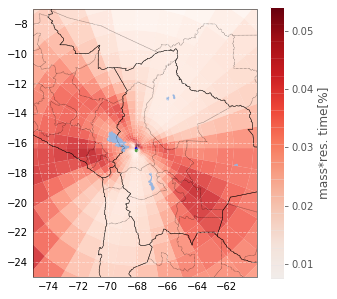

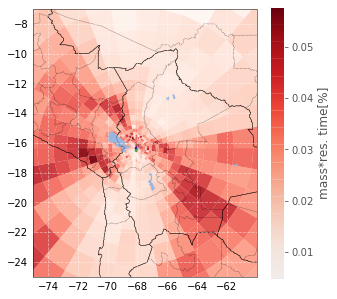

In [5]:
funs.plot_general(ds1)
funs.plot_general(selfFLP.merged_ds)

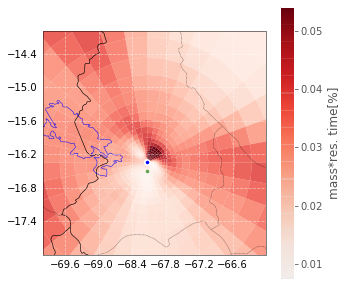

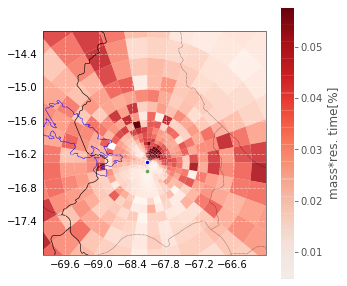

In [6]:
funs.plot_general_lapaz(ds1)
funs.plot_general_lapaz(selfFLP.merged_ds)

In [7]:
dsZ = dsSM.copy()
dfcc = selfFLP.get_vector_df_for_clustering(selfFLP.coarsen_par, ar=dsZ[co.CONC])



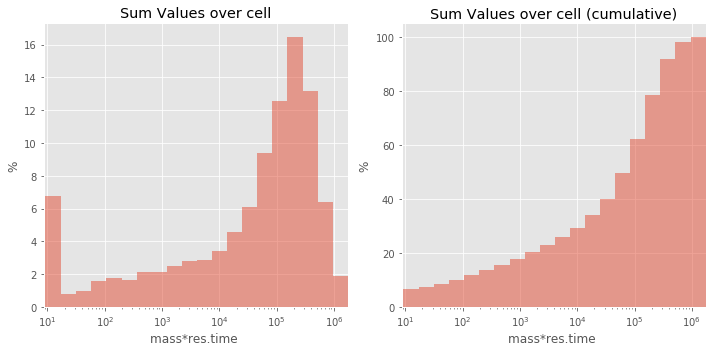

In [8]:
funs.plot_hist_values(dfcc)

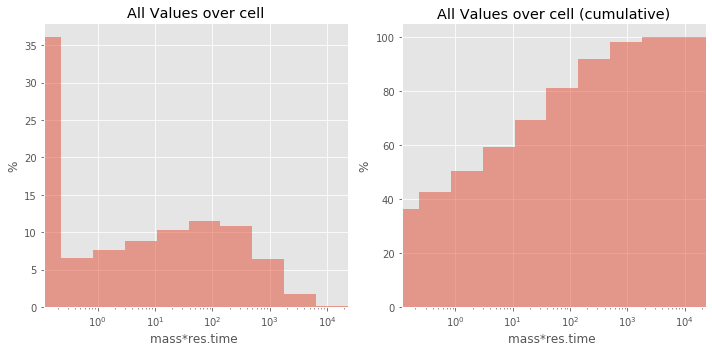

In [9]:
funs.plot_hist_all_values(dfcc)

In [10]:

# lest create the dataset again
dscc = funs.rebuild_the_dscc(dfcc)

funs.print_percentage_res_time_mass_considered(dscc)

97.91222810745239


In [11]:

MAX_LENGTH = 25
dscc = funs.preprocess_dscc_for_clustering(MAX_LENGTH, dscc)

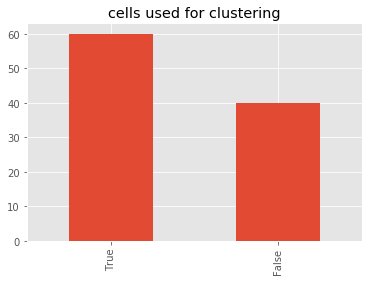

In [12]:
funs.plot_cells_used_for_clustering(dscc)

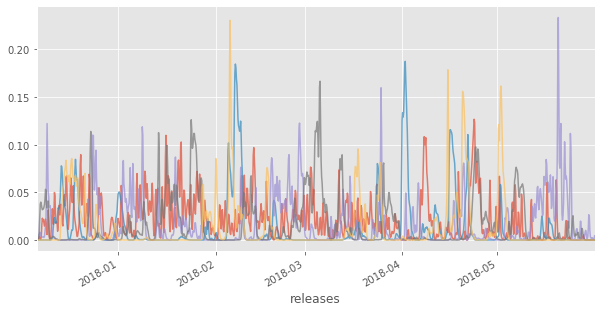

In [13]:
funs.plot_sample_of_vectors_norm_used_for_clustering(dscc)

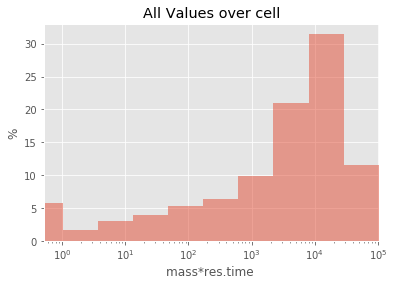

In [14]:
funs.plot_hist_all_log(dscc[co.CONC_NORMS])

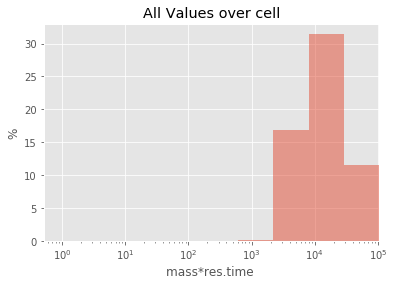

In [15]:
funs.plot_hist_all_log(dscc[co.CONC_NORMS].where(dscc[co.LAB_CLUSTER_THRESHOLD]))

In [16]:
# this one take a long time
dscc = funs.do_clust_multiple(dscc)

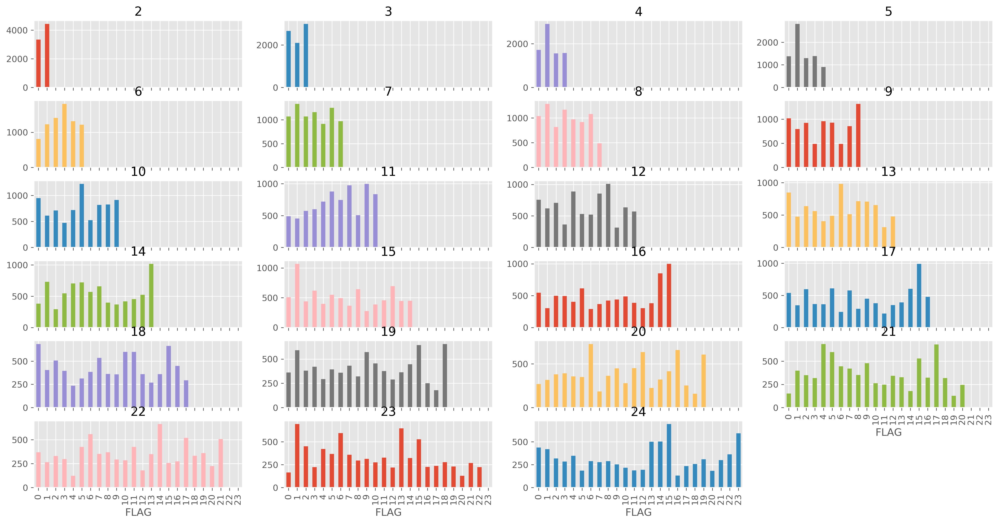

In [108]:
funs.plot_bar_charts_for_each_cluster_set(dscc)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


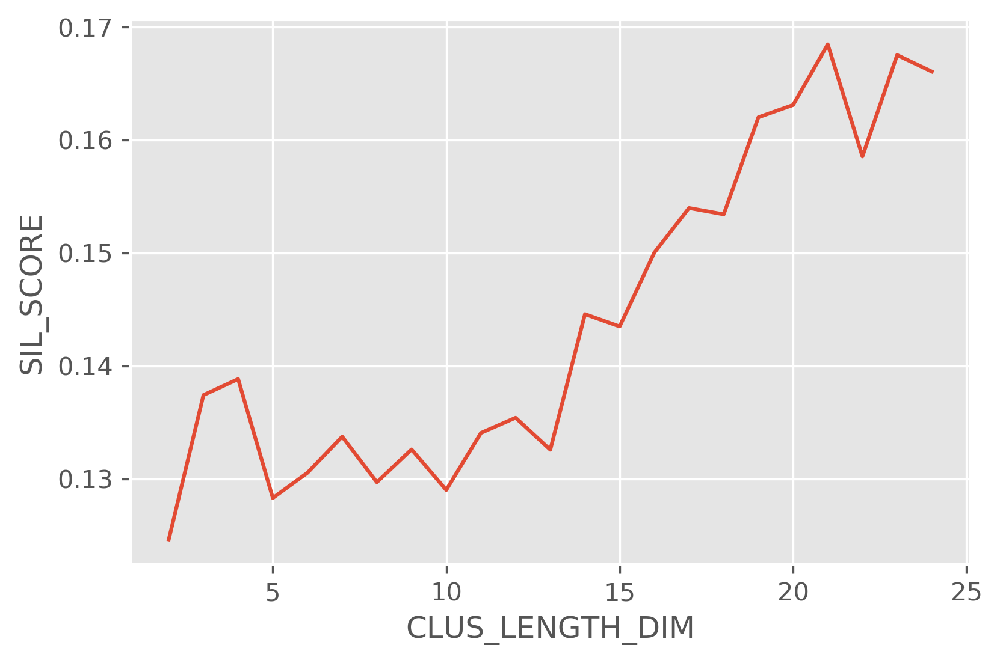

In [109]:
dscc = funs.calc_silhouette_scores(dscc)

dscc[co.SIL_SC].plot()

In [19]:
# ii = 2

In [20]:
# _d = dscc.loc[{co.CLUS_LENGTH_DIM:ii}][[co.FLAG,co.SIL_SC,SIL_SAMPLE]].stack({co.DUM_STACK:[co.R_CENTER,co.TH_CENTER,co.ZM]})

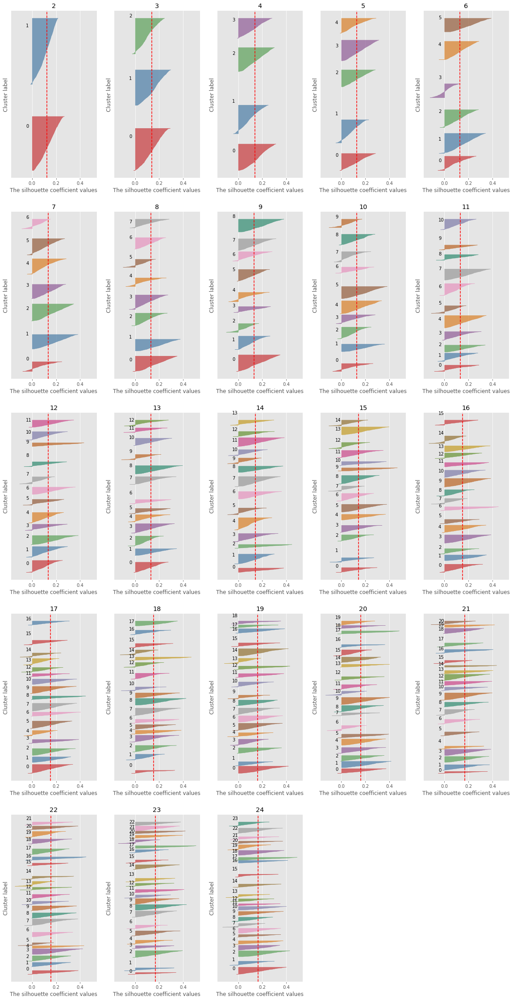

In [21]:
funs.plot_sil_score_grid(dscc)

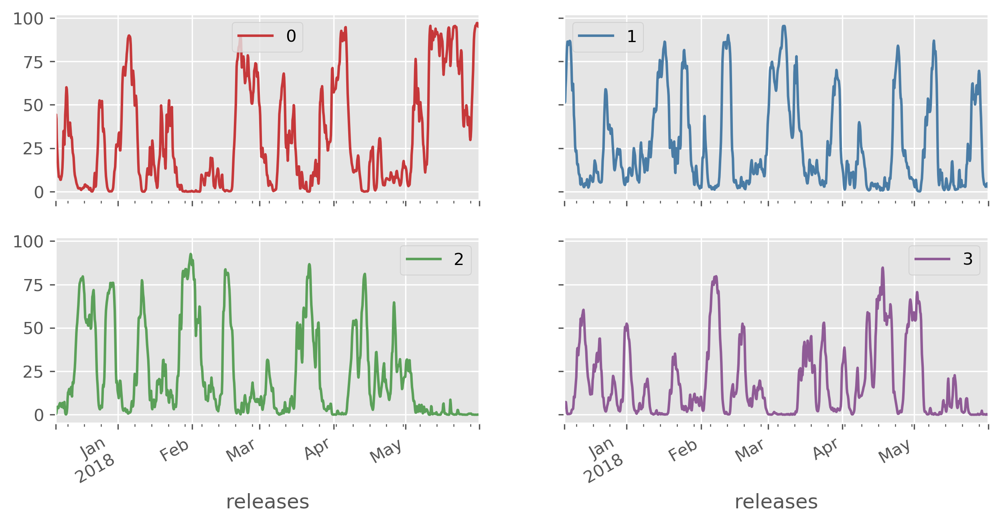

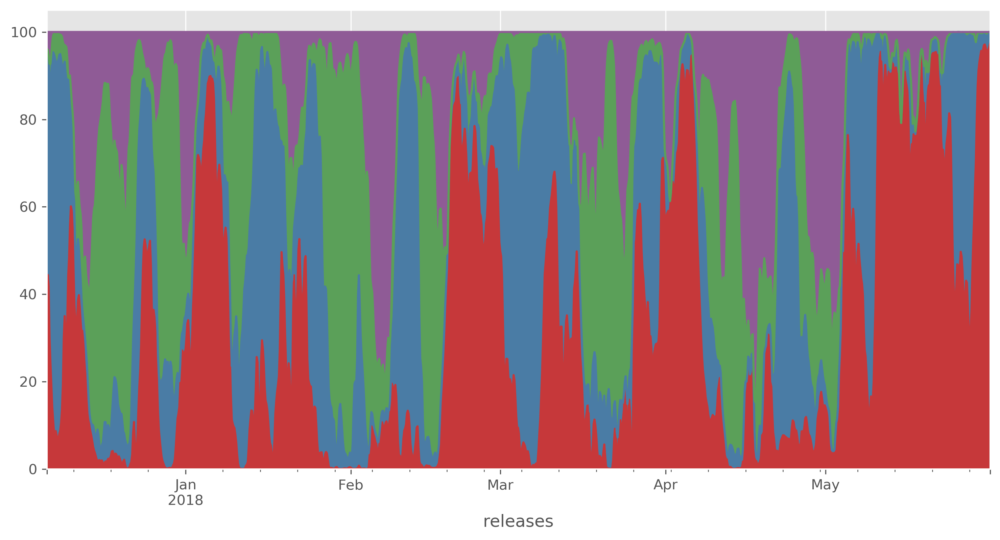

In [110]:
_n = 4
# _f = 2
_ss1 = funs.get_df_for_plot(_n, dscc)

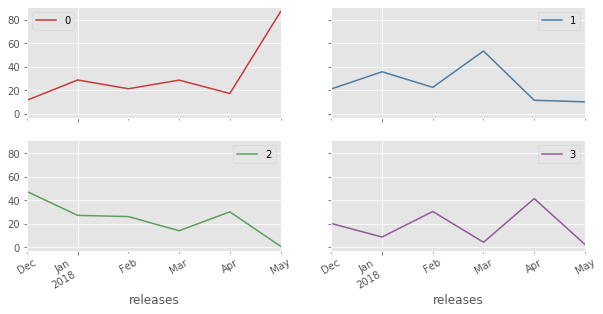

In [23]:
_ss1.plot(sharex=True,sharey=True, layout=(2, -1),subplots=True,figsize=(10,5),color=ucp.cc);

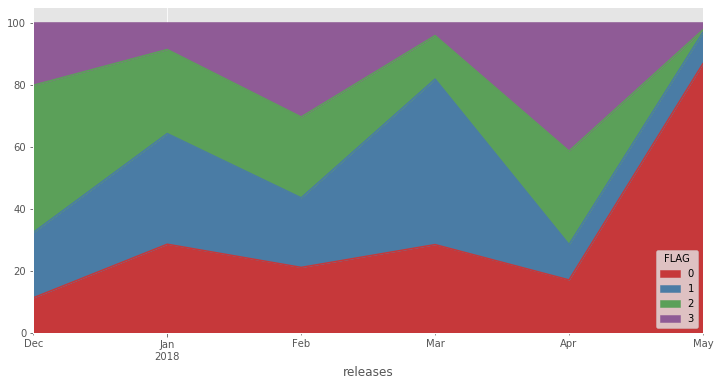

In [24]:
_ss1.plot.area(legend=True, figsize=(12,6),color=ucp.cc)

In [25]:
dscc

<xarray.Dataset>
Dimensions:                (CLUS_LENGTH_DIM: 23, R_CENTER: 36, TH_CENTER: 36, ZMID: 6, releases: 1062)
Coordinates:
  * R_CENTER               (R_CENTER) float64 0.05613 0.06721 ... 25.53 30.57
  * TH_CENTER              (TH_CENTER) float64 0.08727 0.2618 ... 6.021 6.196
  * ZMID                   (ZMID) float64 250.0 1e+03 2.5e+03 ... 8.5e+03 2e+04
  * releases               (releases) datetime64[ns] 2017-12-06T01:30:00 ... 2018-05-31T21:30:00
  * CLUS_LENGTH_DIM        (CLUS_LENGTH_DIM) int64 2 3 4 5 6 ... 20 21 22 23 24
Data variables:
    CONC                   (R_CENTER, TH_CENTER, ZMID, releases) float32 0.0 ... 0.0
    CONC_SUM               (R_CENTER, TH_CENTER, ZMID) float32 0.0 ... 19.822586
    LAB_CLUSTER_THRESHOLD  (R_CENTER, TH_CENTER, ZMID) bool False ... False
    CONC_NORMALIZED        (releases, R_CENTER, TH_CENTER, ZMID) float32 0.0 ... 0.0
    CONC_NORMS             (R_CENTER, TH_CENTER, ZMID) float32 1.0 ... 3.4963744
    KMEAN_LAB              (CL

In [26]:
dscc = funs.add_lat_lon_to_dscc(dscc, selfFLP)

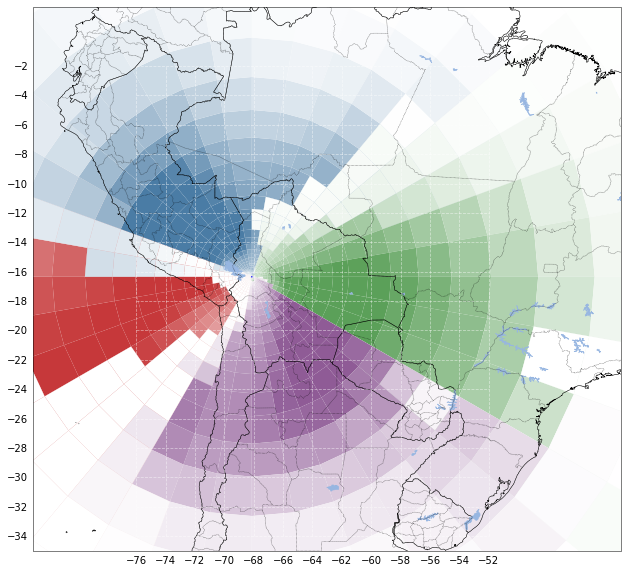

In [27]:
funs.plot_clust_in_bolivia(_n, dscc)

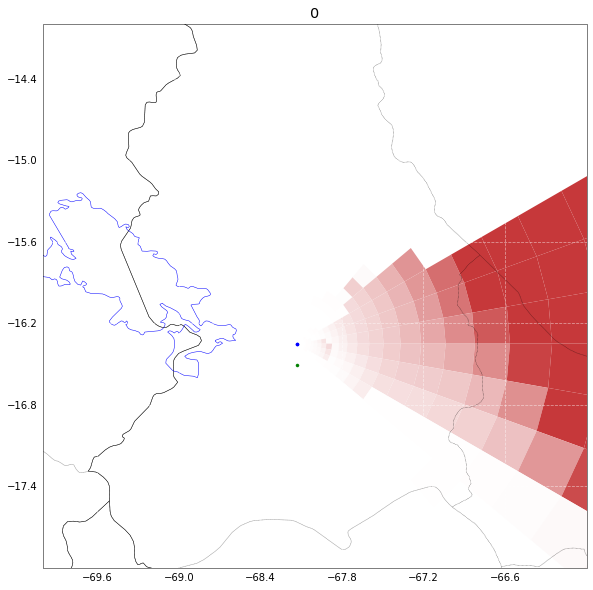

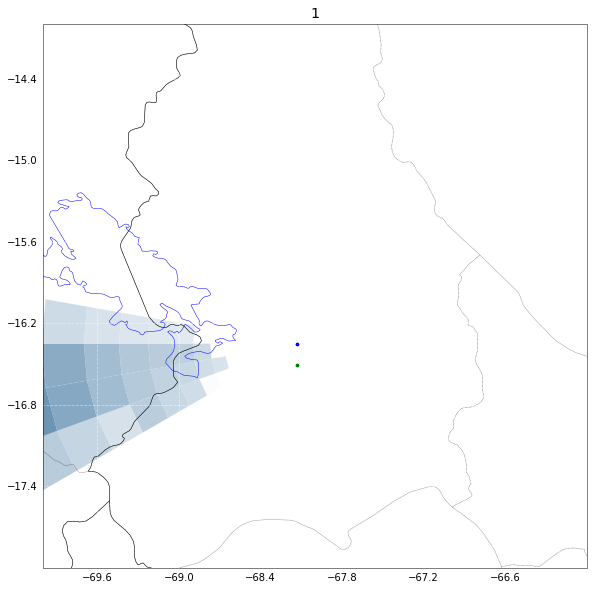

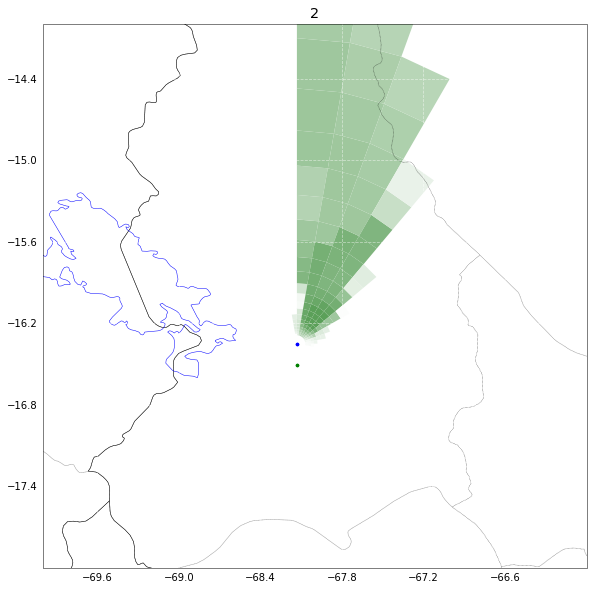

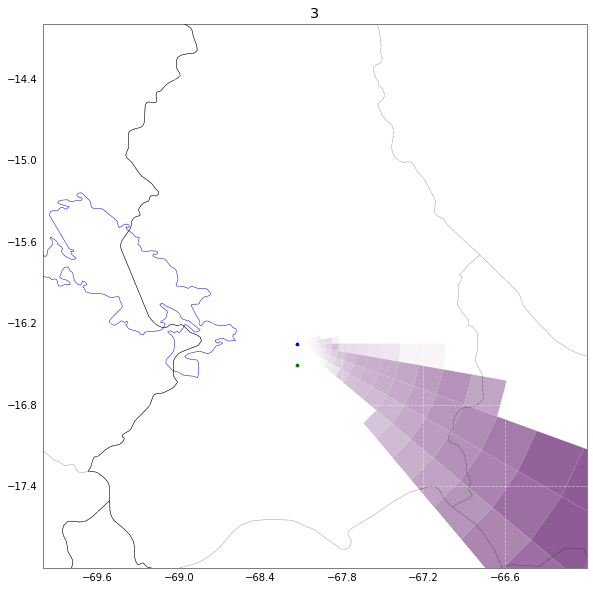

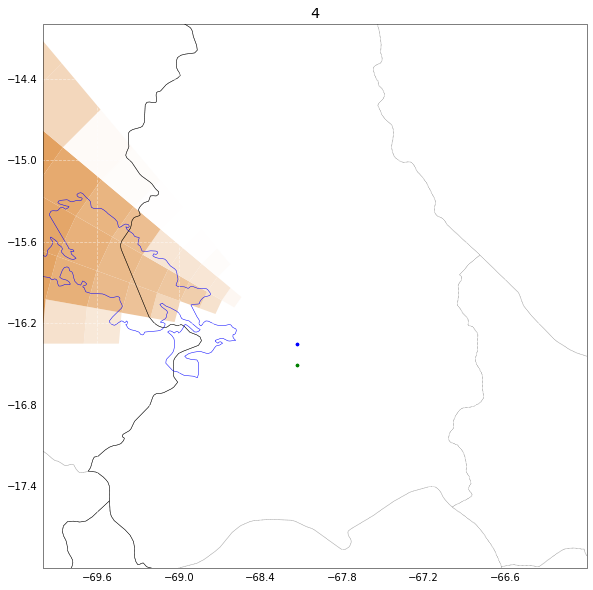

...

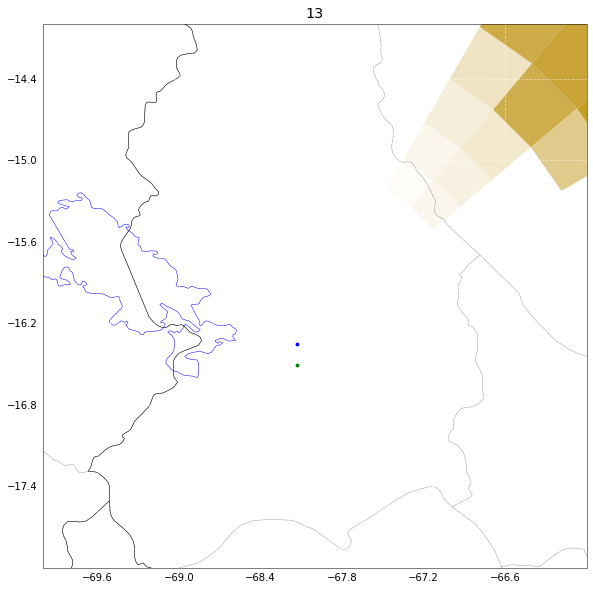

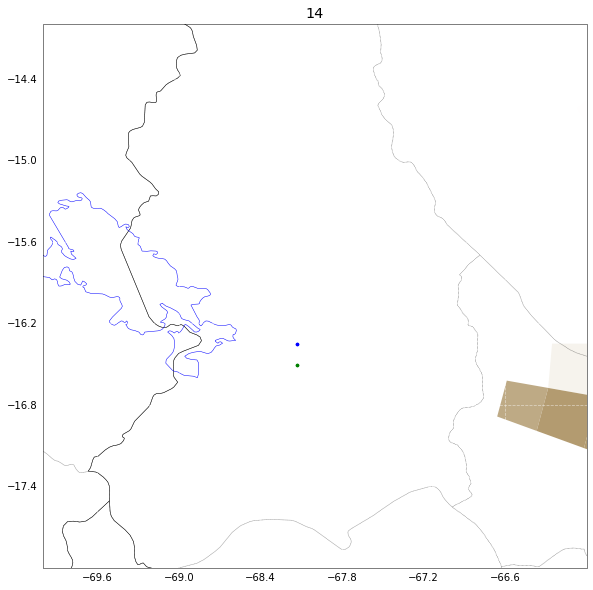

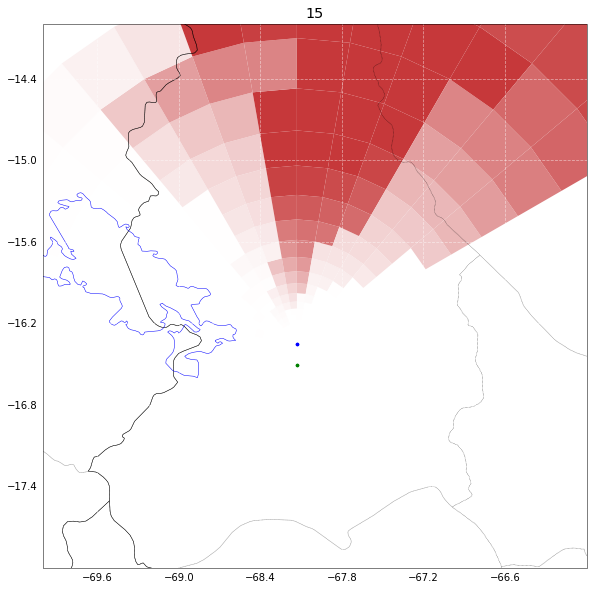

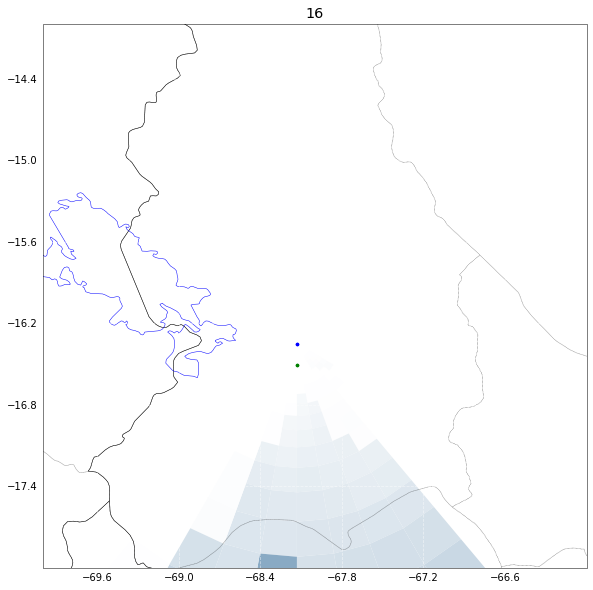

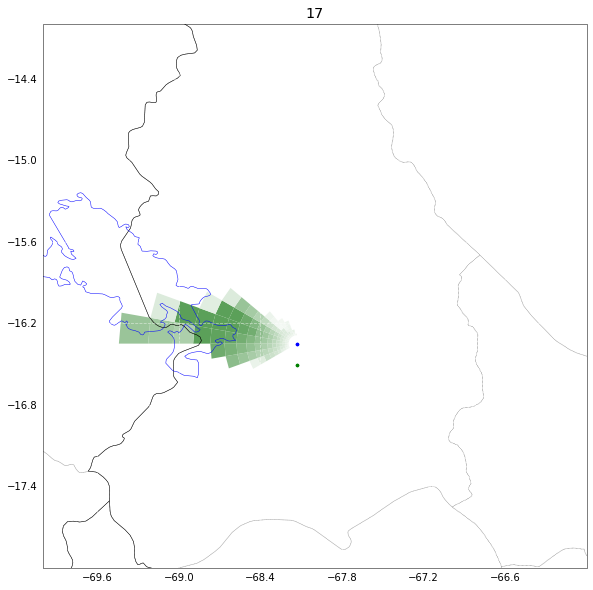

In [28]:
_n = 18
funs.plot_clust_in_lapaz(_n, dscc)

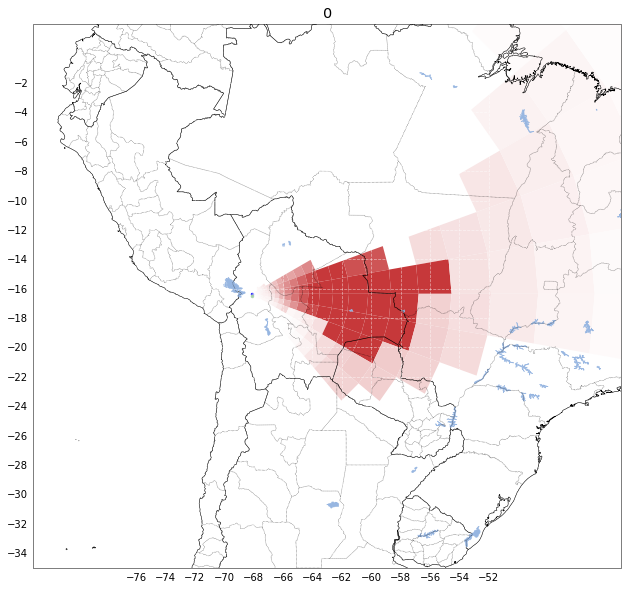

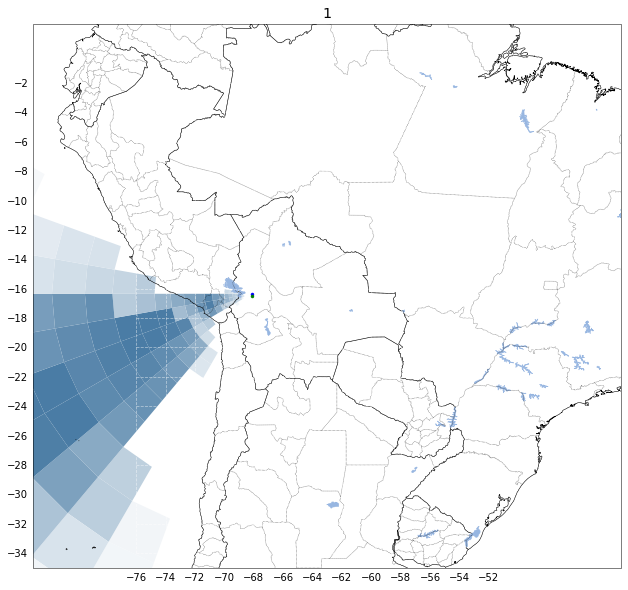

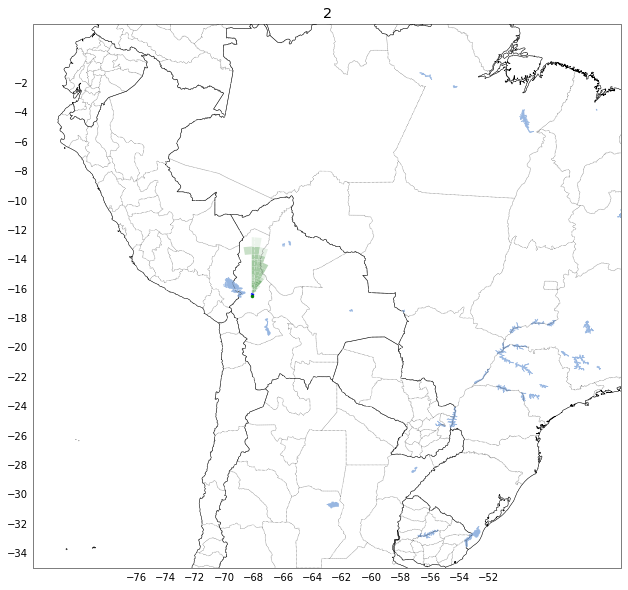

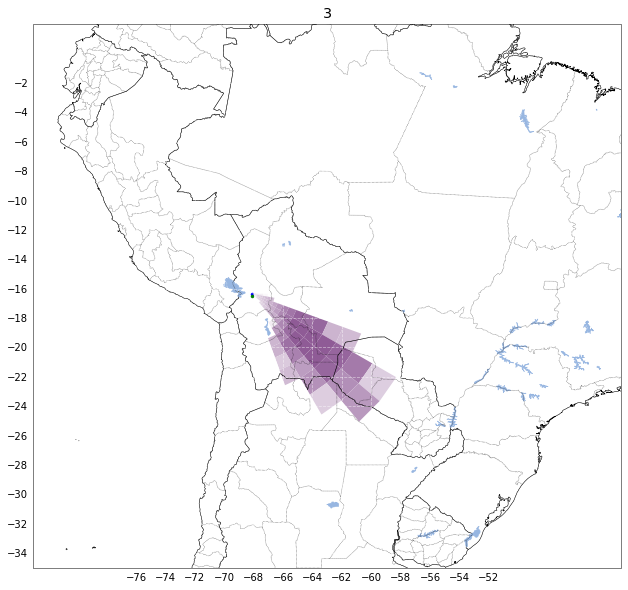

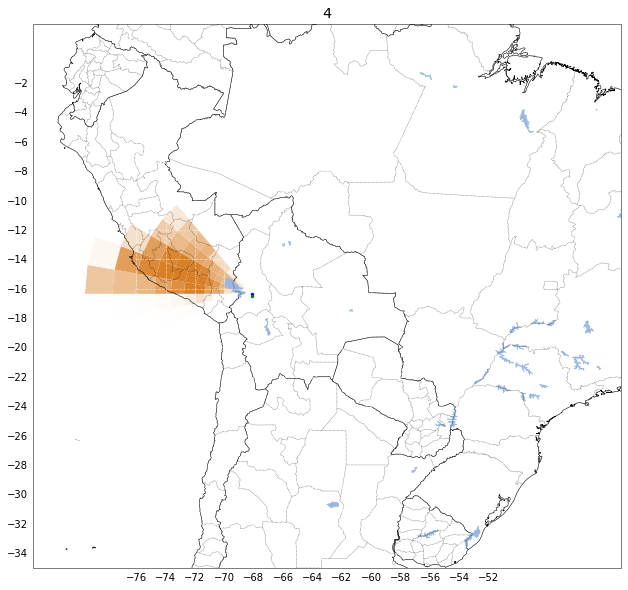

...

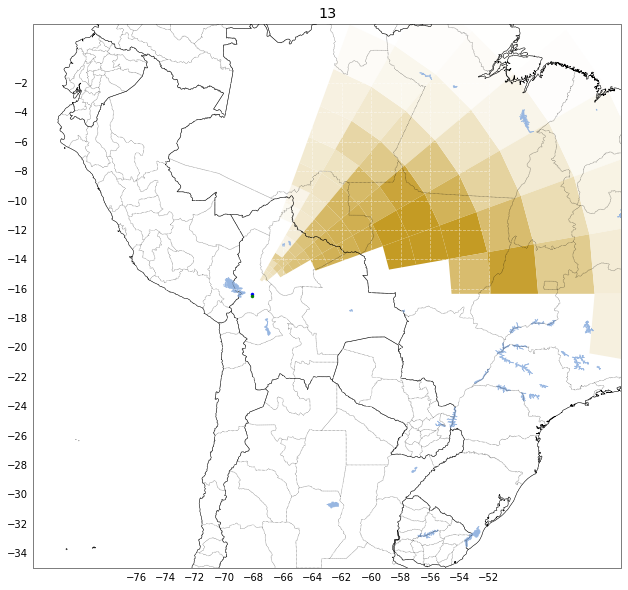

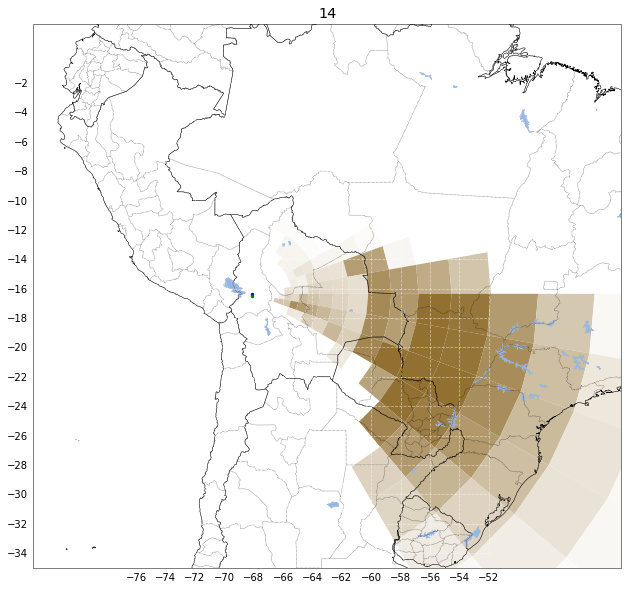

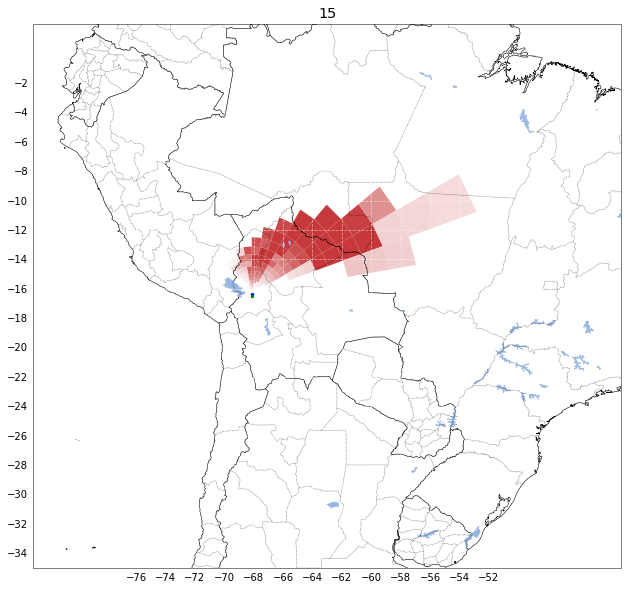

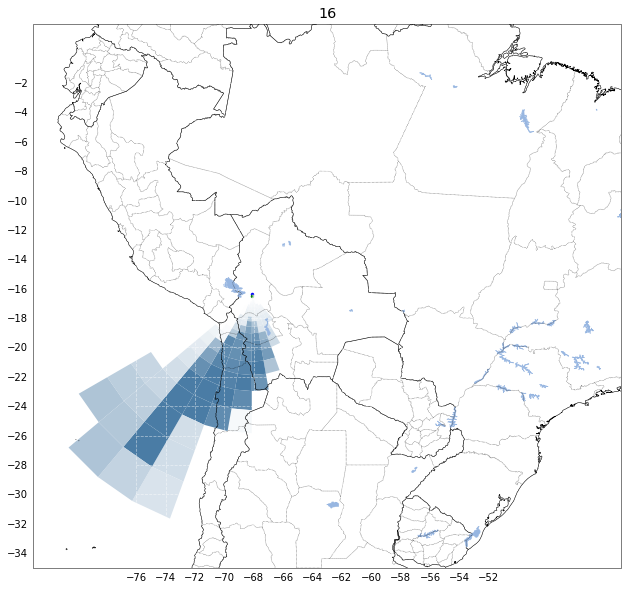

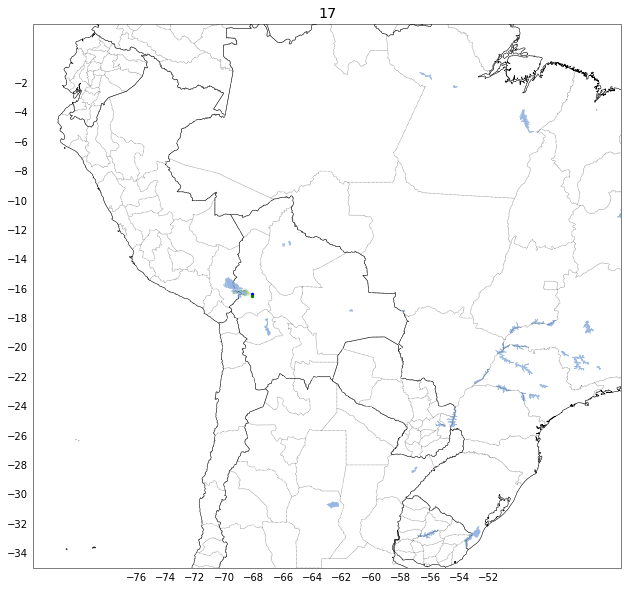

In [29]:

_n = 18
funs.plot_clust_bolivia_individual(_n, dscc)

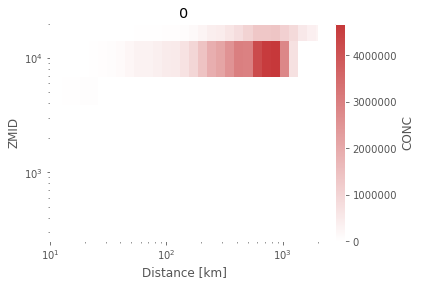

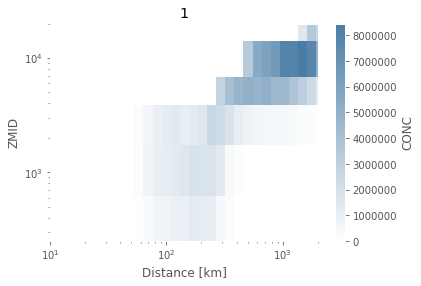

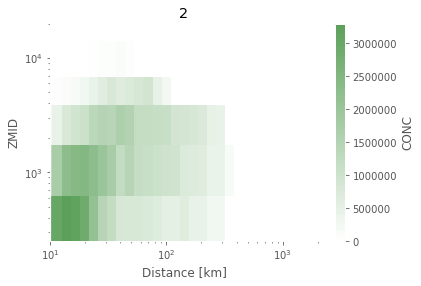

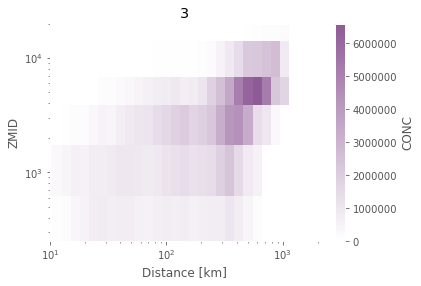

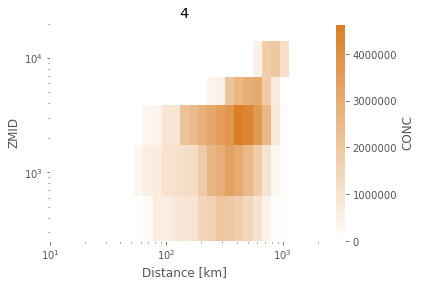

...

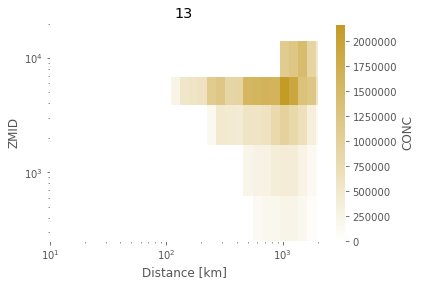

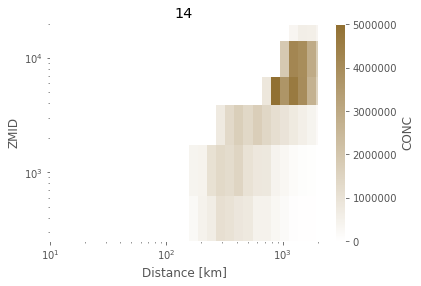

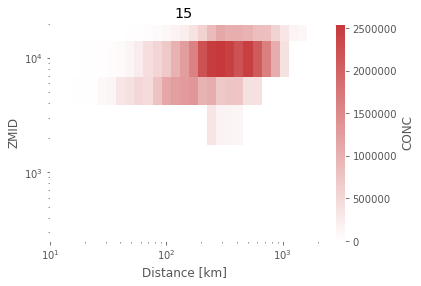

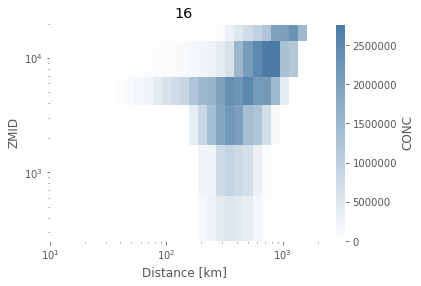

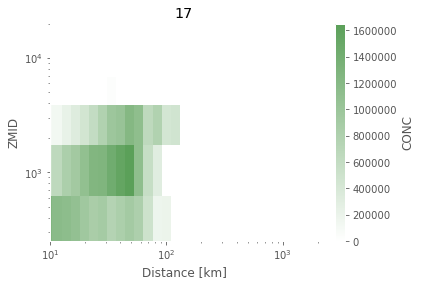

In [30]:
_f = 2
_n = 18
funs.plot_distance_height_chc(_n, dscc)

In [111]:
dscc = funs.add_dis_km_dscc(dscc)

In [112]:
dsF[co.TOPO]

<xarray.DataArray 'TOPOGRAPHY' (R_CENTER: 36, TH_CENTER: 36)>
array([[4858.383 , 4967.62  , 5007.2373, ..., 4880.5156, 4789.8086, 4899.203 ],
       [4784.0117, 4850.6484, 4955.0063, ..., 5060.6313, 5098.8477, 4992.897 ],
       [4691.9575, 4718.7505, 4799.628 , ..., 5173.5557, 5367.306 , 5034.177 ],
       ...,
       [   0.    ,    0.    ,    0.    , ...,    0.    ,    0.    ,    0.    ],
       [   0.    ,    0.    ,    0.    , ...,    0.    ,    0.    ,    0.    ],
       [   0.    ,    0.    ,    0.    , ...,    0.    ,    0.    ,    0.    ]],
      dtype=float32)
Coordinates:
  * R_CENTER    (R_CENTER) float64 0.05613 0.06721 0.08046 ... 21.33 25.53 30.57
  * TH_CENTER   (TH_CENTER) float64 0.08727 0.2618 0.4363 ... 5.847 6.021 6.196
    LON         (R_CENTER, TH_CENTER) float64 -68.08 -68.08 ... -38.6 -37.68
    LAT_00      (R_CENTER, TH_CENTER) float64 -16.3 -16.3 -16.3 ... 9.903 11.16
    LON_00      (R_CENTER, TH_CENTER) float64 -68.13 -68.12 ... -77.69 -72.98
    LAT_10     

/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home

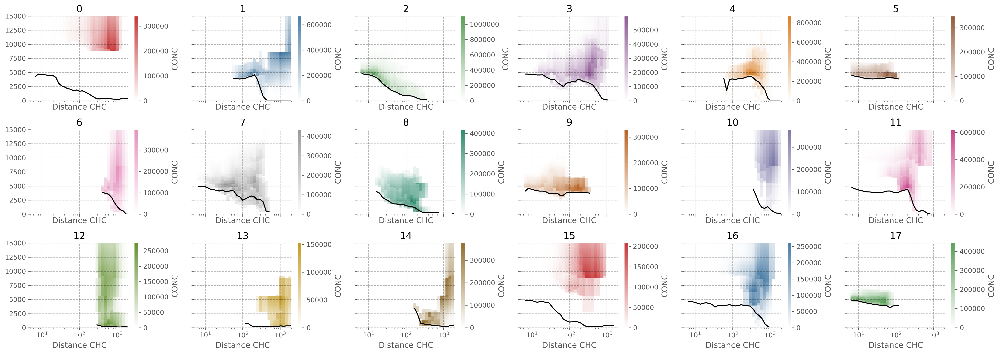

In [44]:
mpl.rcParams['figure.dpi'] = 300
_cols = 6
_rows = 3
fig, axs = plt.subplots(_rows,_cols,sharex=True,sharey=True,figsize=(3.5*_cols,2.5*_rows))
axsf = axs.flatten()

log.ger.setLevel(log.log.ERROR)
_ds = funs.plot_dis_height_quantiles_chc(_n, dsF, dscc,axs=axsf)
fig.tight_layout()

In [ ]:
mpl.rcParams['figure.dpi'] = 300
_cols = 6
_rows = 3
fig, axs = plt.subplots(_rows,_cols,sharex=True,sharey=True,figsize=(3.5*_cols,2.5*_rows))
axsf = axs.flatten()

log.ger.setLevel(log.log.ERROR)


/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home

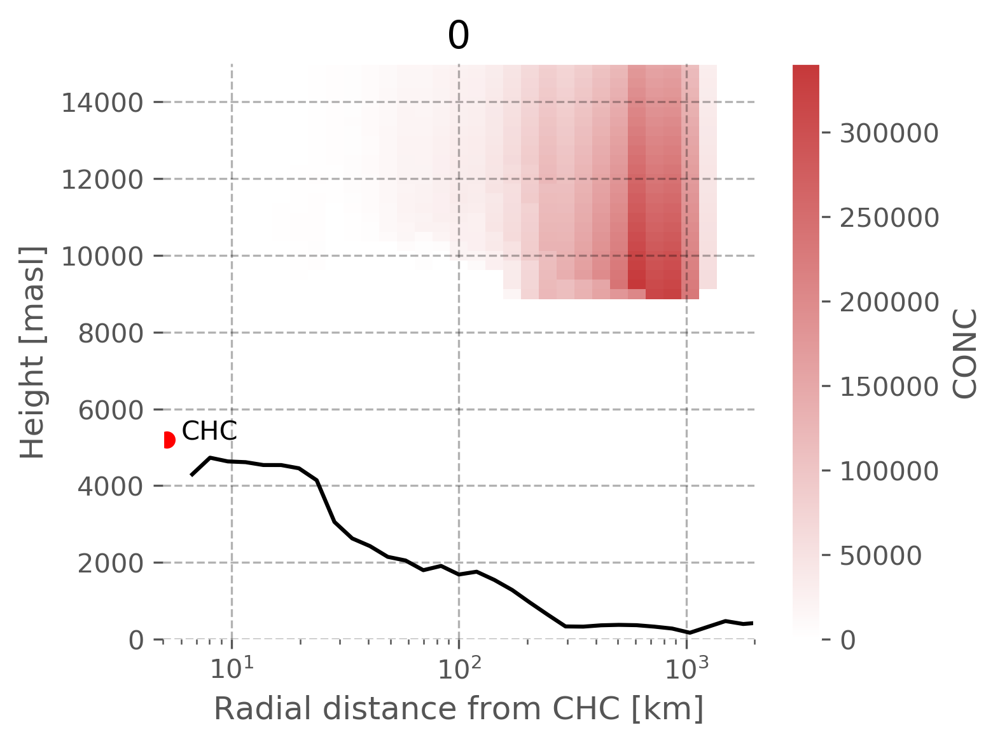

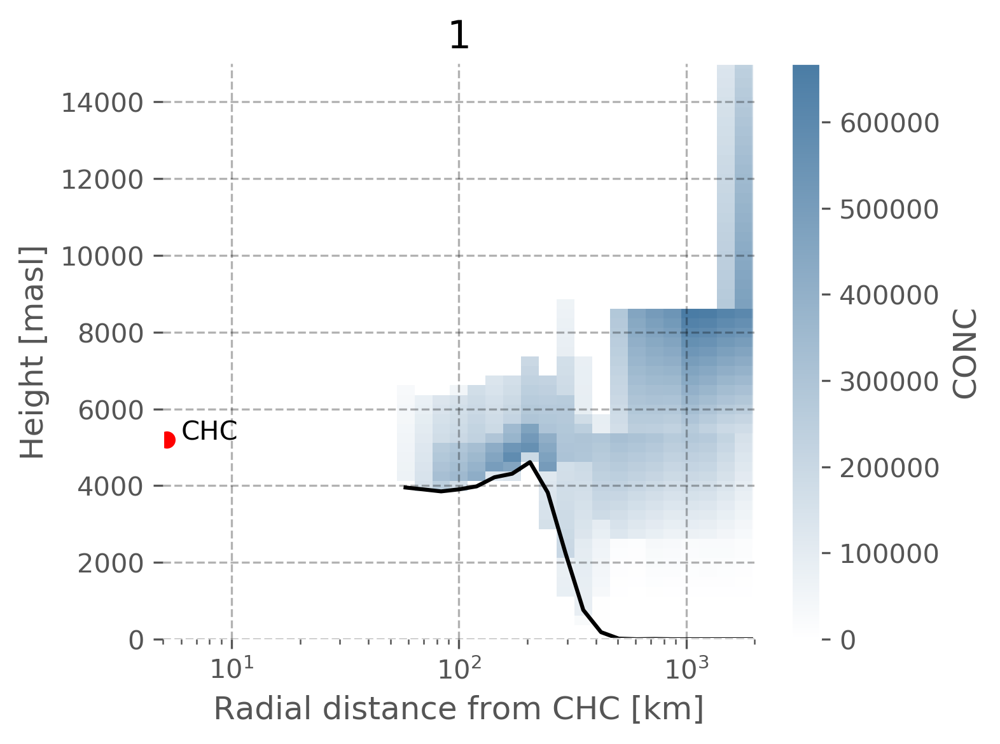

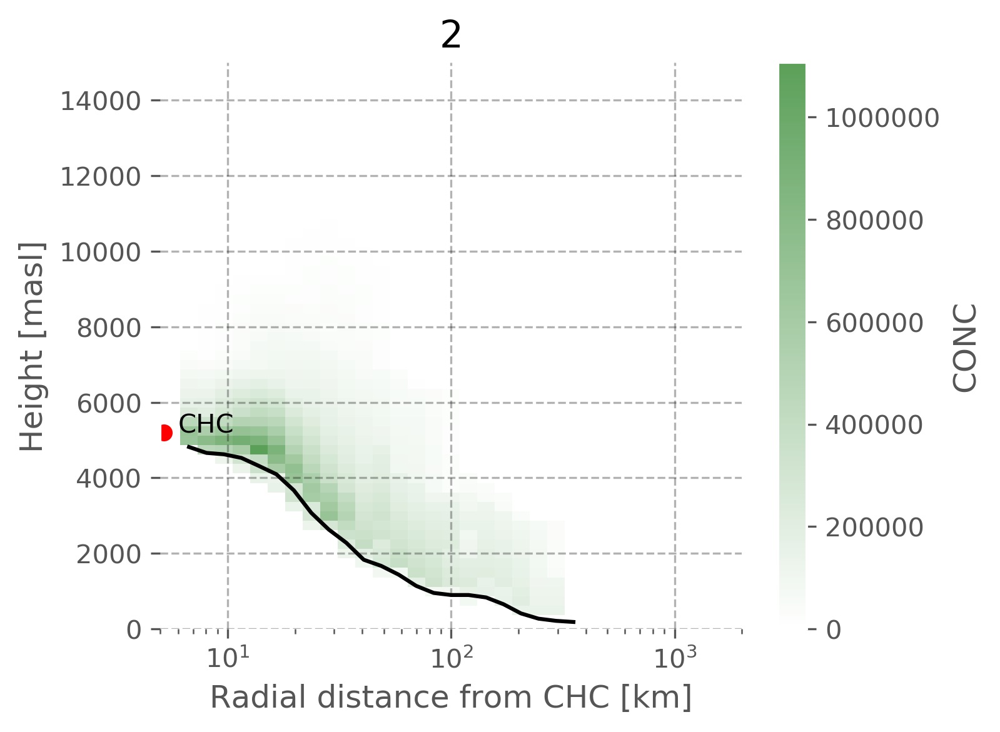

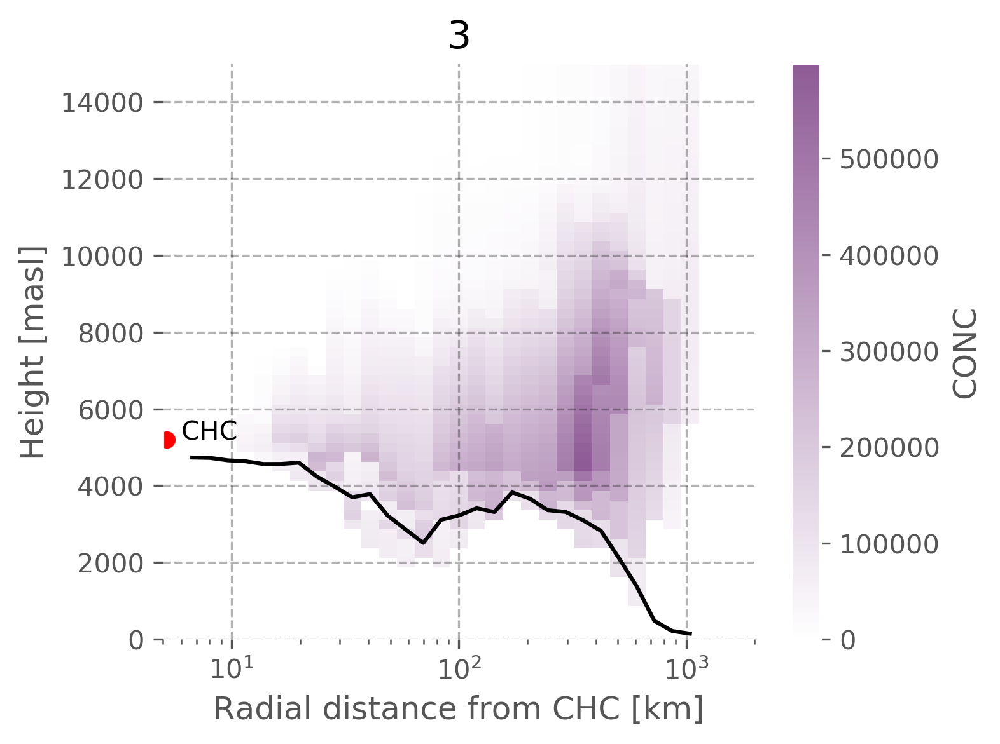

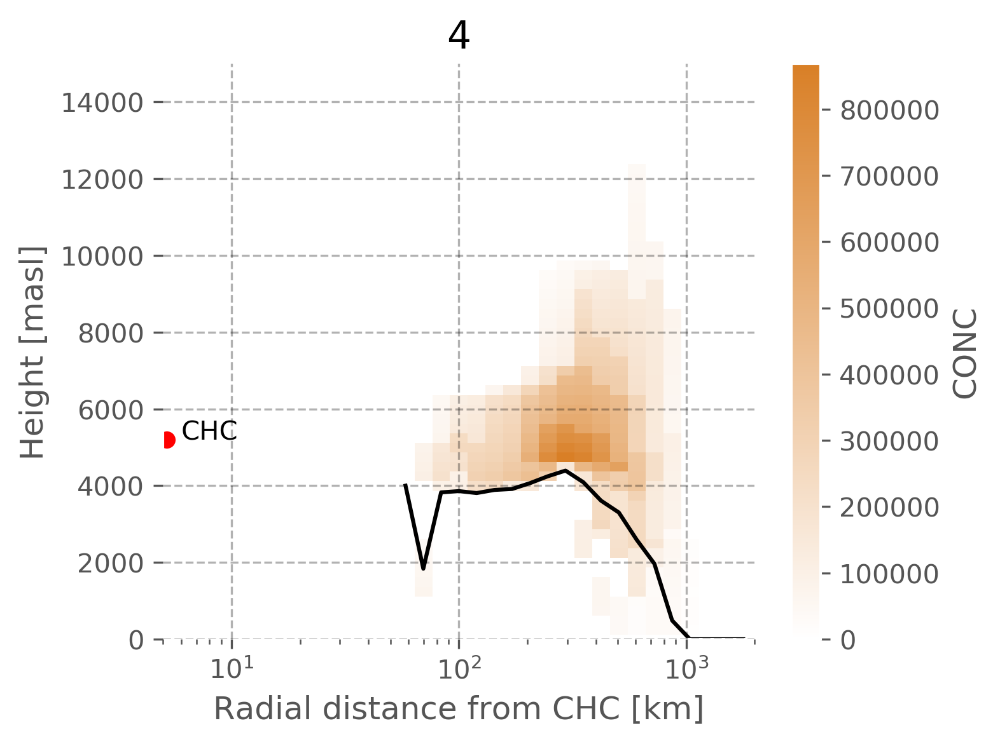

...

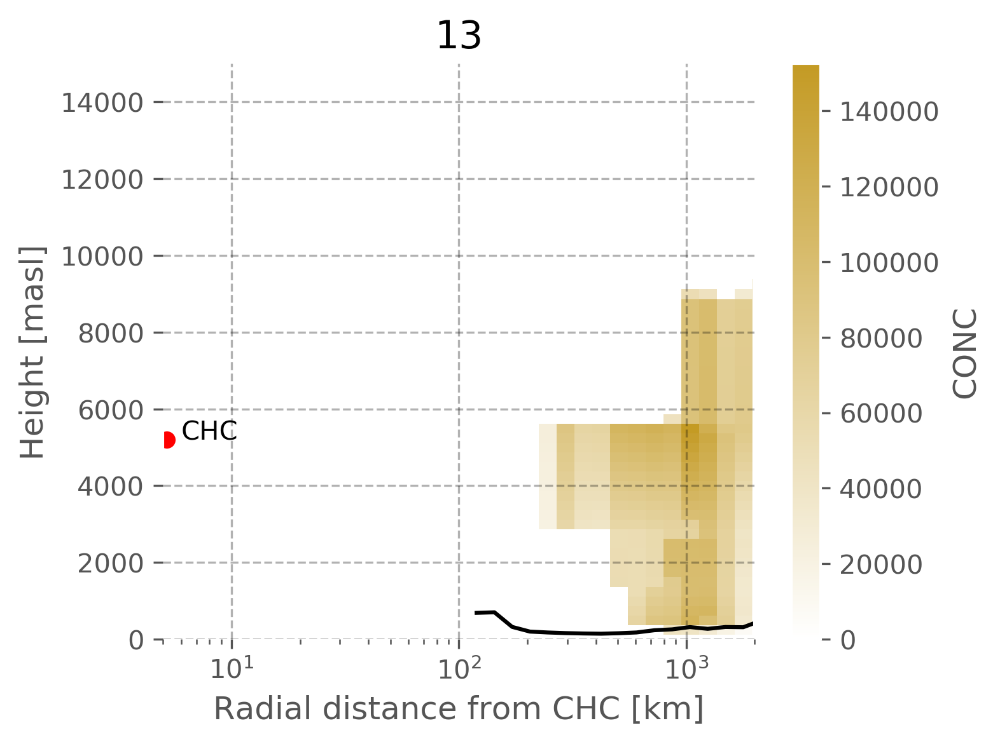

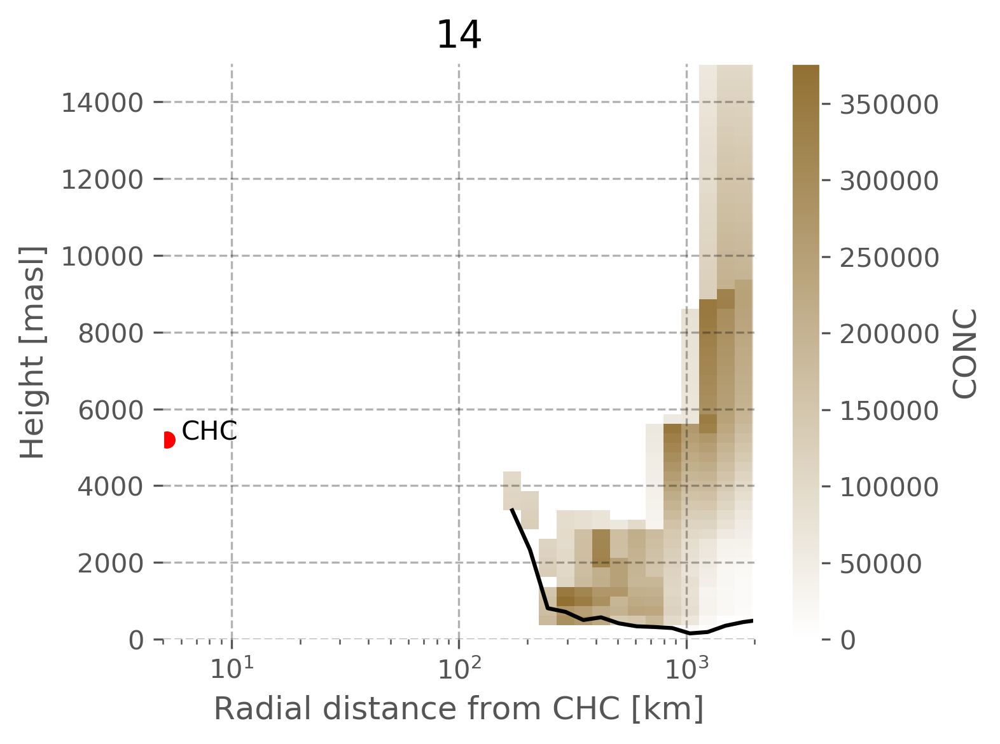

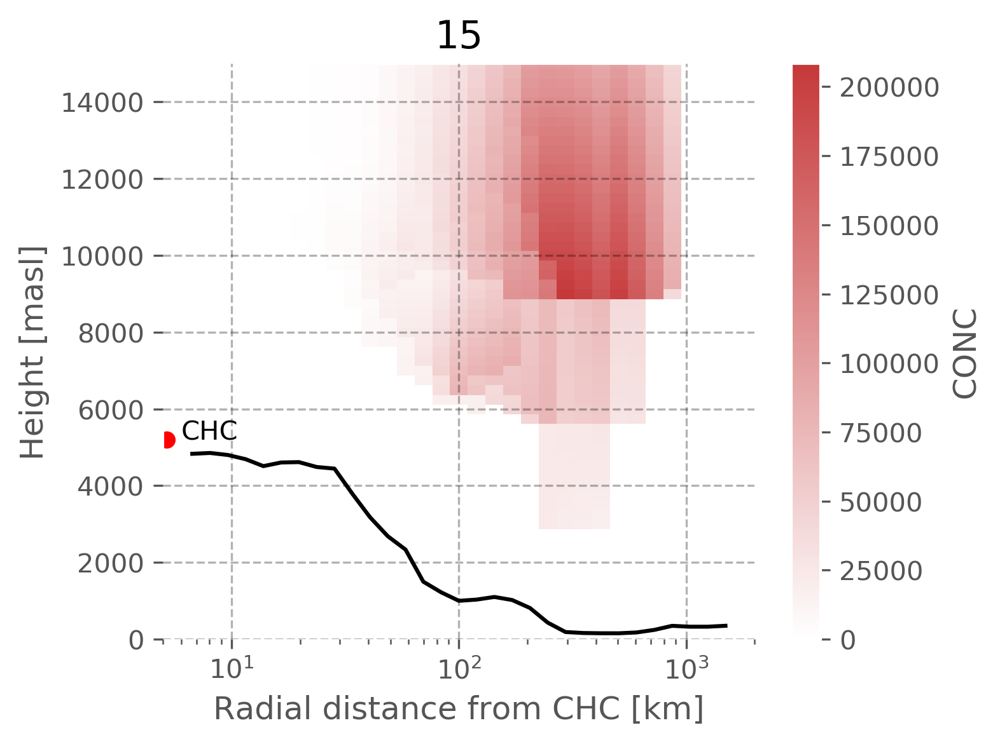

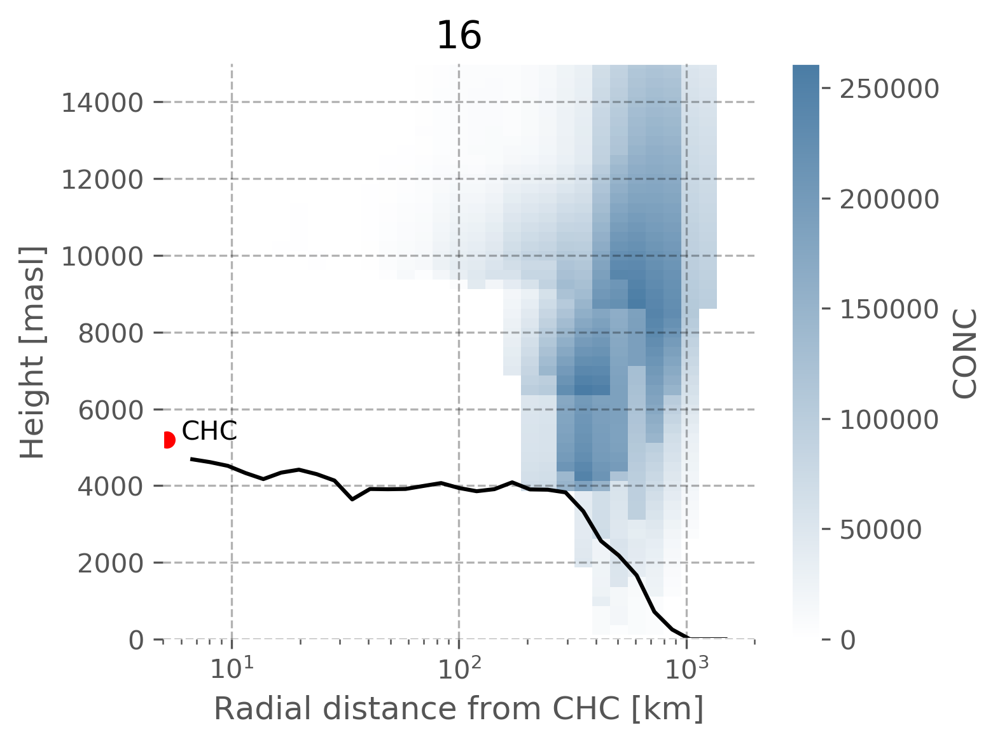

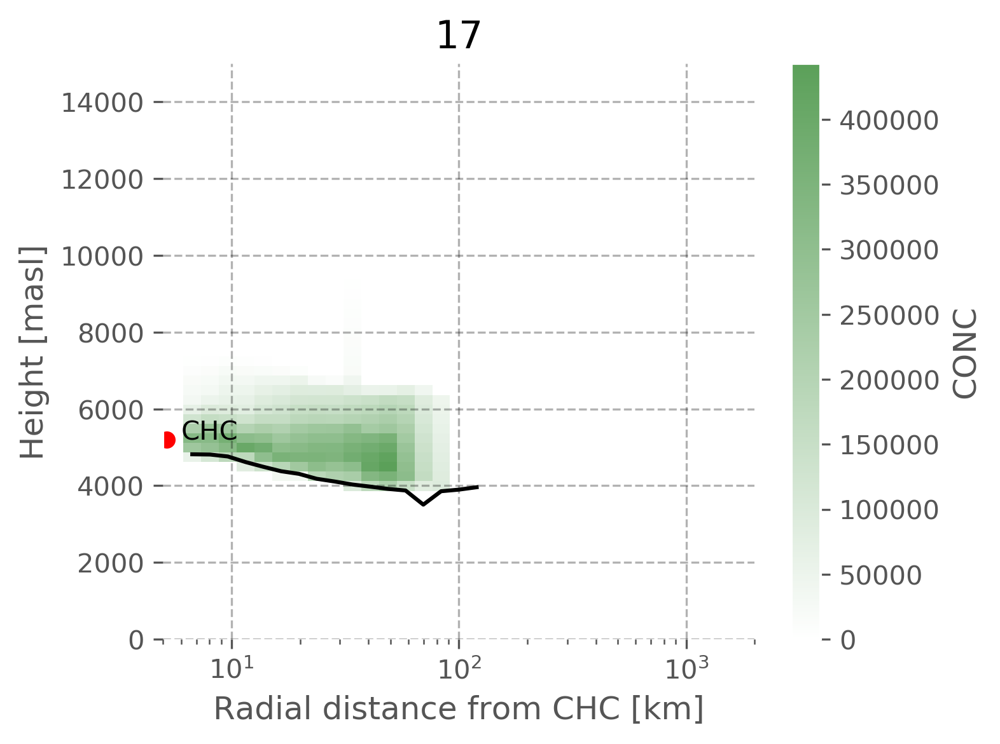

In [80]:
for _f in range(_n):
    ax = axsplot(figsize=(5,4))
    funs.plot_dis_height_quantiles_chc_single(_f,_n, dsF, dscc,axs=ax)

True

In [116]:
!jupyter-nbconvert --to markdown main.ipynb

[NbConvertApp] Converting notebook main.ipynb to markdown
[NbConvertApp] Support files will be in main_files/
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making directory main_files
[NbConvertApp] Making director

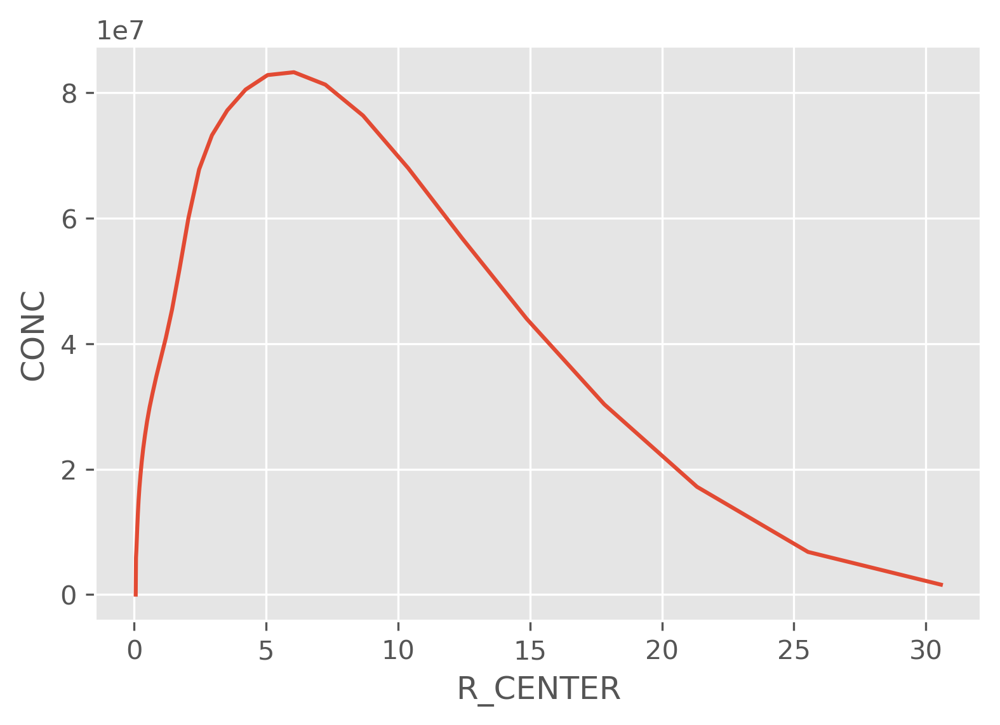

In [45]:
dscc[co.CONC].sum([co.TH_CENTER,co.ZM,co.RL]).plot()

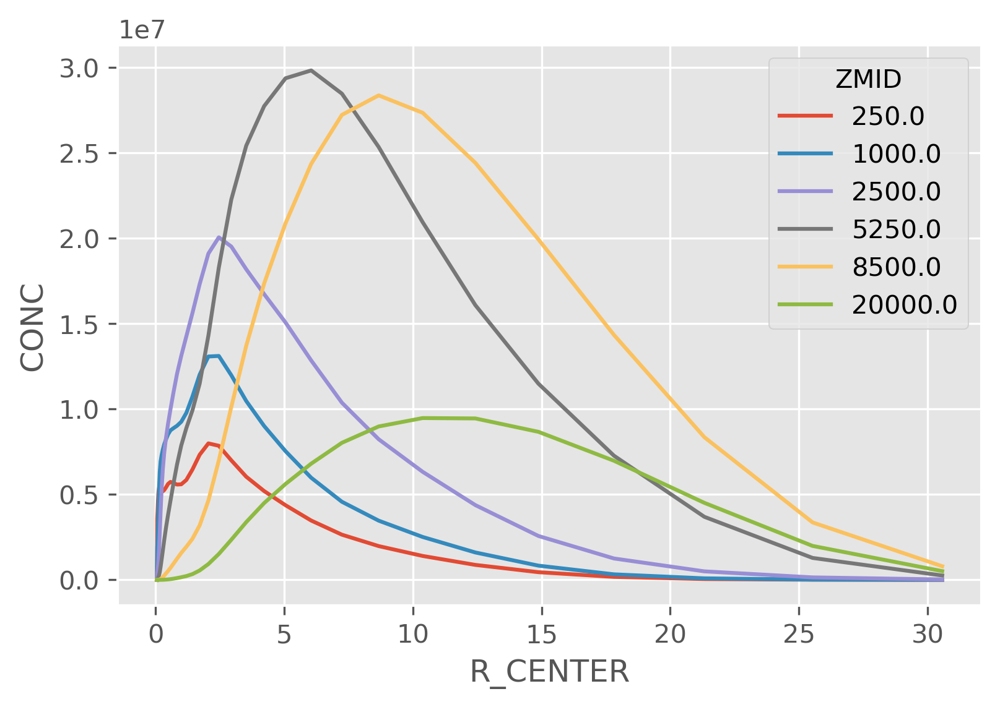

In [46]:
dscc[co.CONC].sum([co.TH_CENTER,co.RL]).plot.line(x=co.R_CENTER);

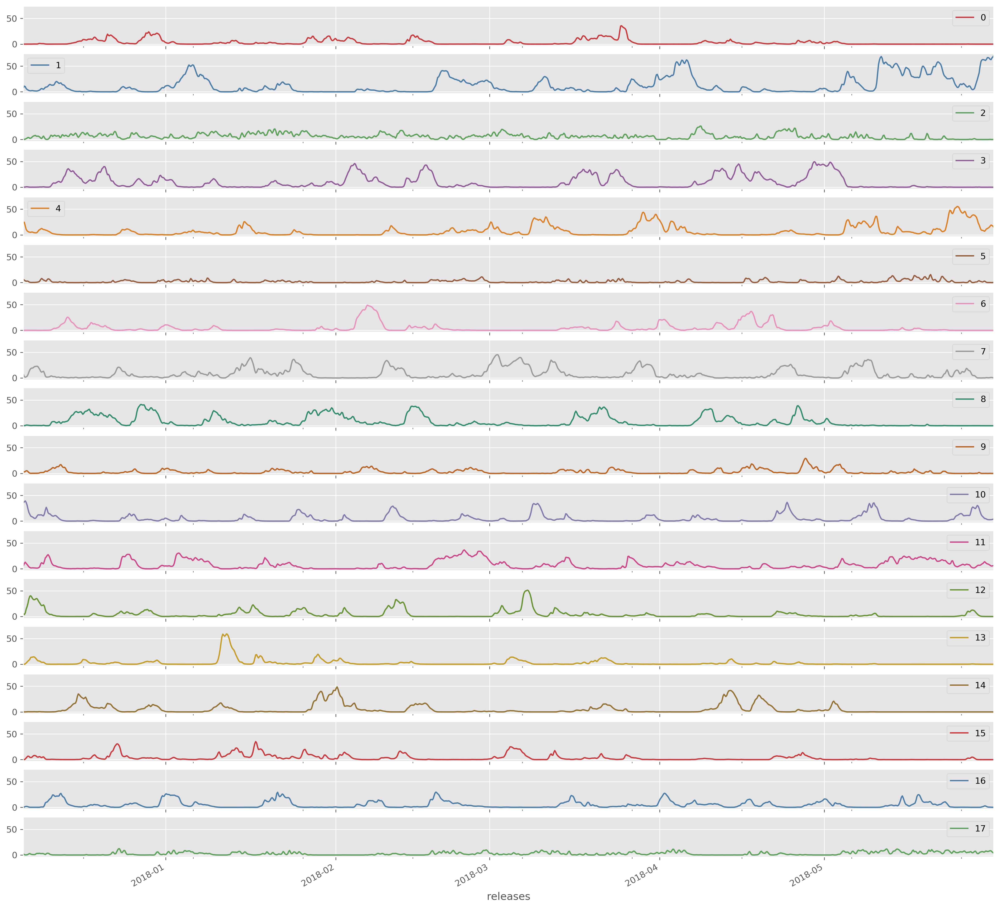

In [113]:
_n = 18
funs.plot_influences(_n, dscc)

In [114]:
less_than = 1000000
more_than = 0
height_less_than = 100000000

_ds = dscc.loc[{co.CLUS_LENGTH_DIM: _n}].copy()
try: _ds = _ds.drop(co.KMEAN_OBJ)
except: pass

_dss = _ds.copy()
_ds[co.CONC] = _ds[co.CONC].where(dscc[co.R_CENTER] < less_than,
                                  0).where(
    dscc[co.R_CENTER] > more_than, 0).where(
    dscc[co.ZM] < height_less_than, 0)
_ds1 = _ds[[co.CONC, co.FLAG]]
_dss1 = _dss[[co.CONC, co.FLAG]]
_ds2 = _ds1.to_dataframe()
_dss2 = _dss1.to_dataframe()
_ds3 = _ds2[[co.CONC, co.FLAG]]
_dss3 = _dss2[[co.CONC, co.FLAG]]
_df = _ds3.reset_index([co.R_CENTER, co.TH_CENTER, co.ZM],
                       drop=True).reset_index().set_index(
    [co.FLAG, co.RL])
_dff = _dss3.reset_index([co.R_CENTER, co.TH_CENTER, co.ZM],
                         drop=True).reset_index().set_index(
    [co.FLAG, co.RL])
_df1 = _df.sort_index().groupby([co.FLAG, co.RL]).sum()
_dff1 = _dff.sort_index().groupby([co.FLAG, co.RL]).sum()
_df2 = _df1.unstack(co.FLAG)[co.CONC]
_dff2 = _dff1.unstack(co.FLAG)[co.CONC]
_df2 = 100 * (_df2.T / _dff2.T.sum()).T


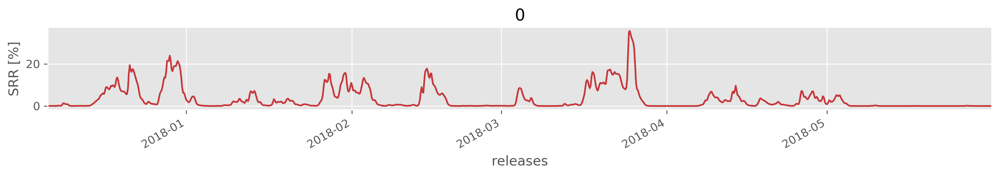

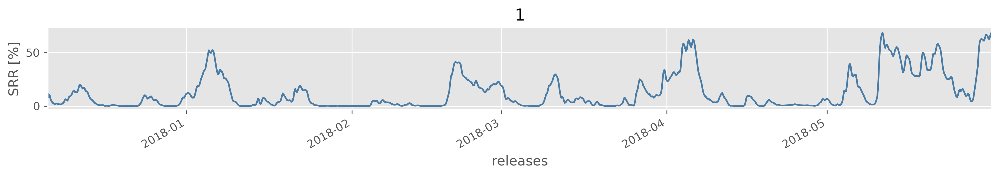

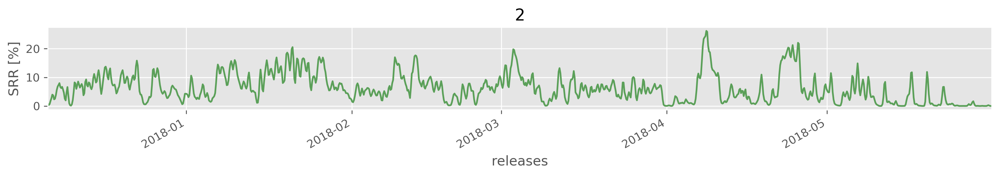

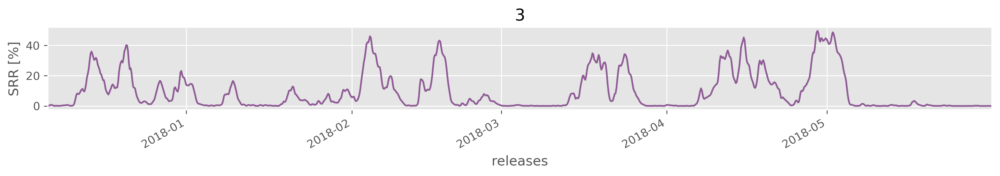

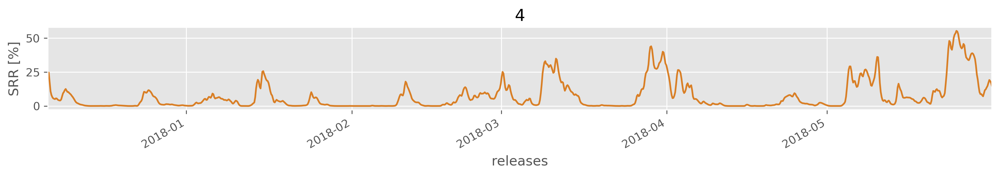

...

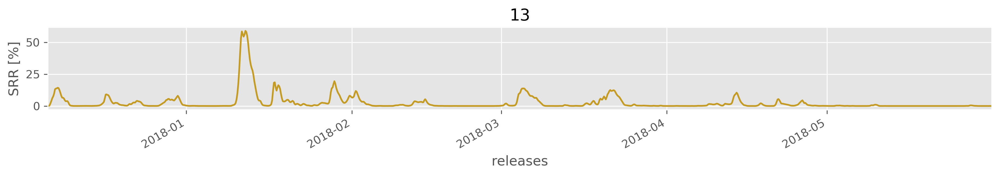

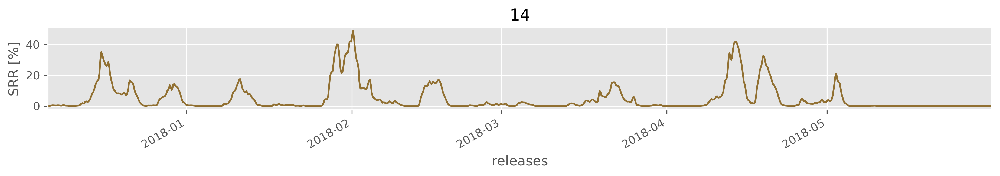

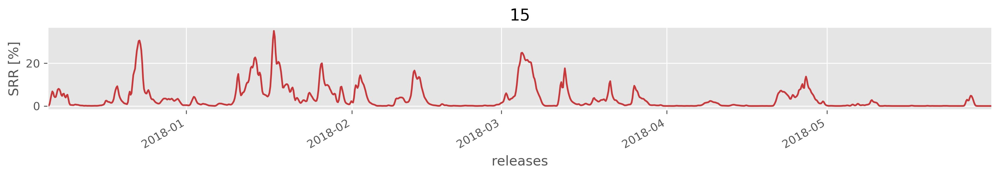

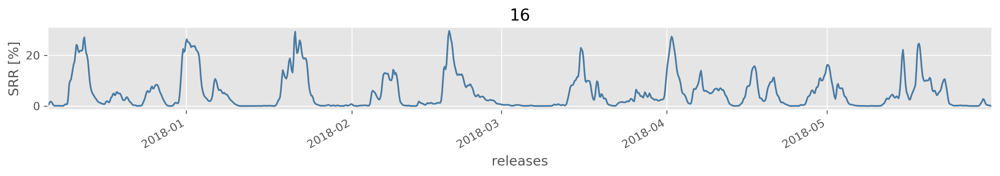

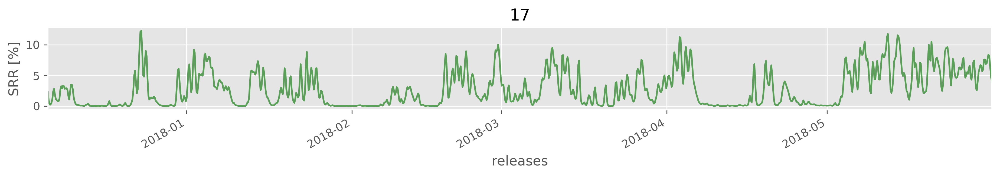

In [115]:
_f = 1 
for _f in range(_n):
    ax = axsplot()
    _df3 = _df2[_f]
    ax=_df3.plot( figsize=(15, 1.5),
              color=[[*ucp.cc, *ucp.cc][_f]])
    ax.set_title(f'{_f}')
    ax.set_ylabel('SRR [%]')


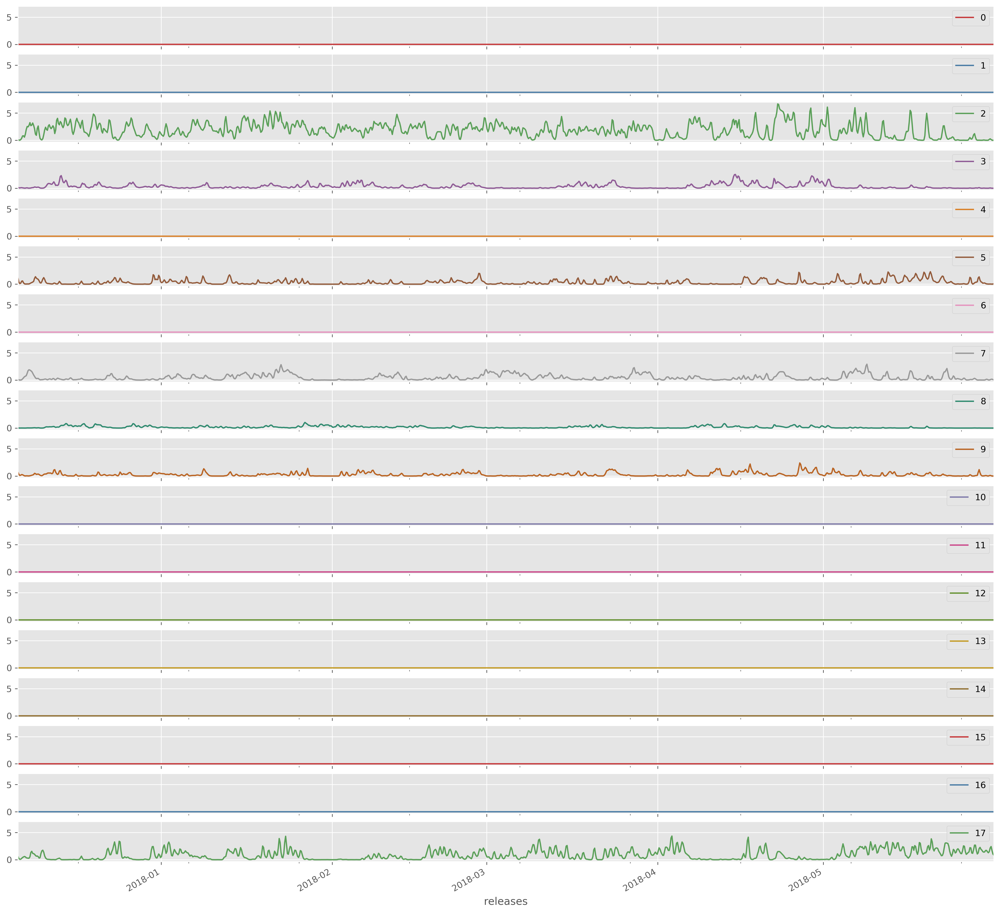

In [54]:
_n = 18
less_than = .5
more_than = .05
height_less_than = 1000

funs.plot_target_distance_height_influence(_n, dscc, height_less_than,
                                           less_than, more_than)

In [49]:

_n = 18

In [50]:
mdsc = selfFLP.merged_ds.copy()

In [51]:
_dscc = dscc.drop([co.KMEAN_OBJ,co.CONC,co.CONC_NORMALIZED,co.RL])
_dscc=xr.merge([mdsc,_dscc])
_dscc[co.CONC] = _dscc[co.CONC].where(_dscc[co.CONC].sum([co.R_CENTER,co.TH_CENTER,co.ZM])>2e5)
_dscc[co.CONC] = _dscc[[co.CONC]].resample(releases='H').mean()[co.CONC]

/homeappl/home/aliagadi/appl_taito/miniconda3/envs/b36backup/lib/python3.6/site-packages/xarray/core/nanops.py:160: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


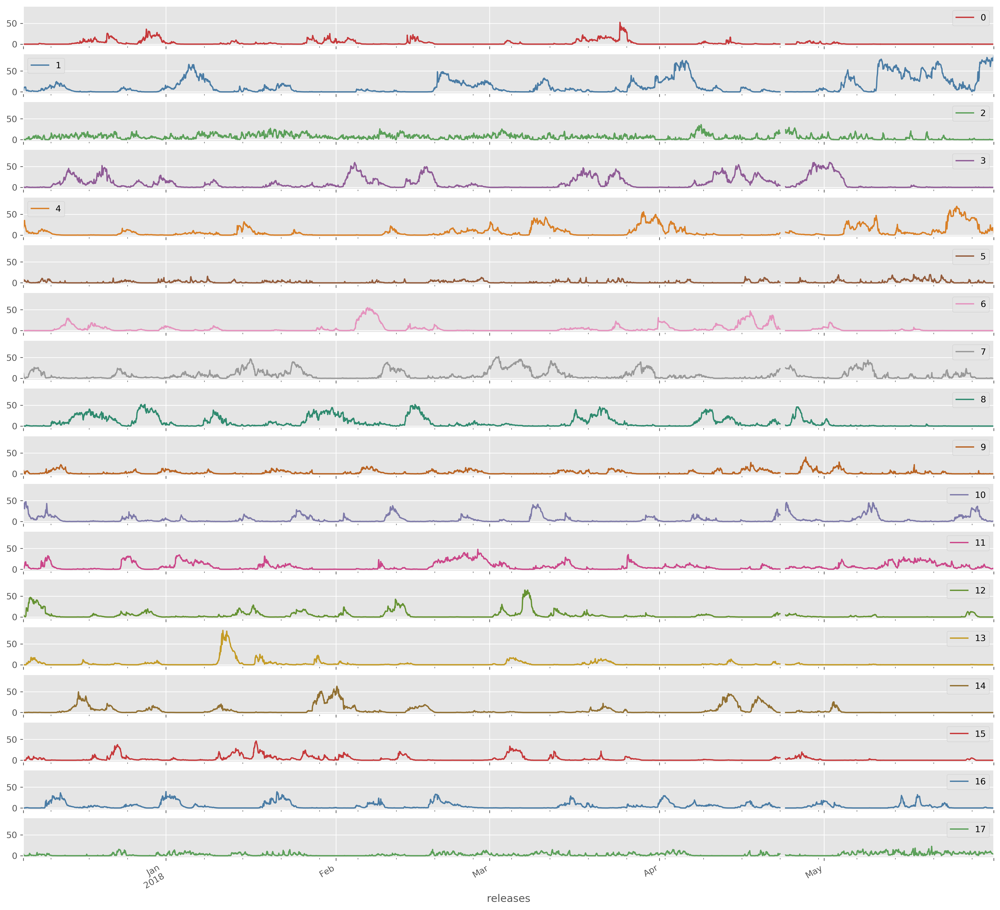

In [52]:
_n = 18
funs.plot_influences(_n, _dscc)

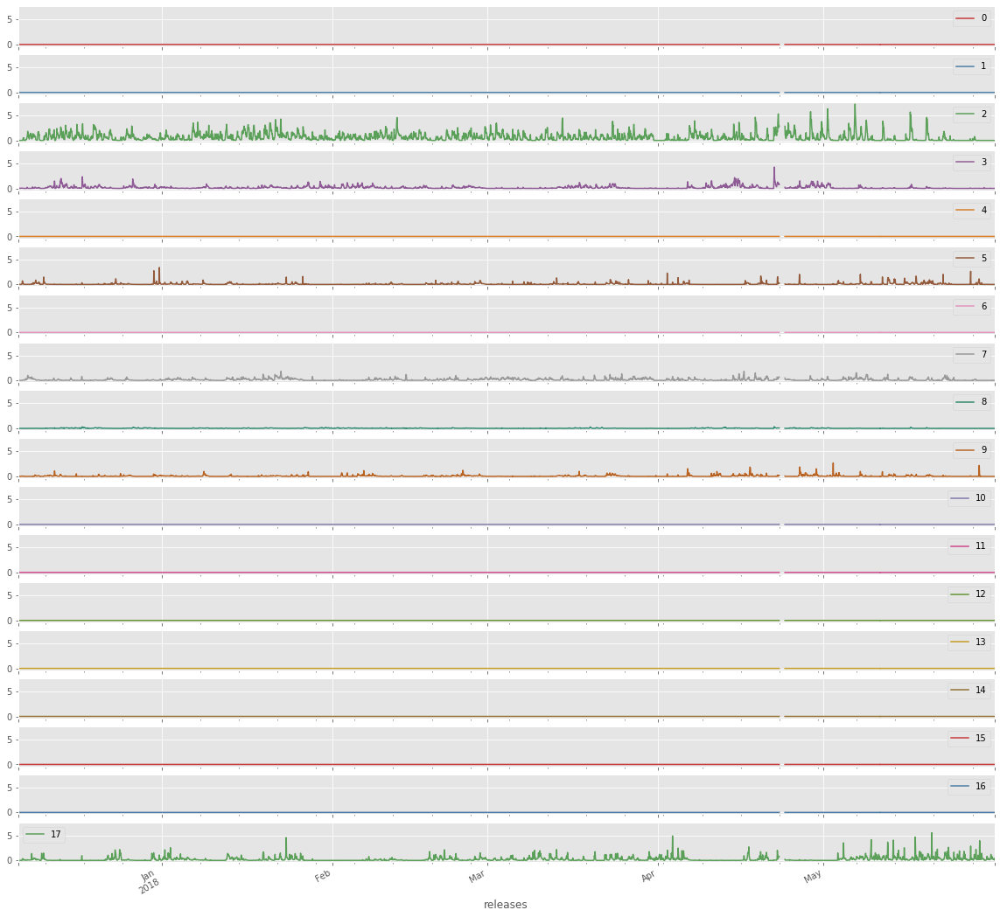

In [42]:
_n = 18
less_than = .3
more_than = .15
height_less_than = 1000

funs.plot_target_distance_height_influence(_n, _dscc, height_less_than,
                                           less_than, more_than)

KeyboardInterrupt: 

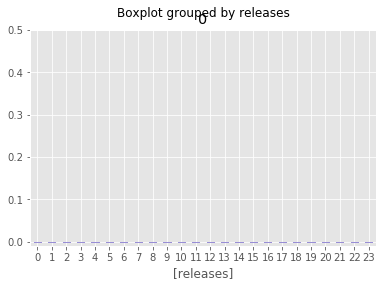

In [43]:
_ns = [0,2,8,9,11,14]

for _nn in _ns:

    funs.plot_hour_influence_targeted(_n, _nn, _dscc, height_less_than,
                                      less_than, more_than)

In [ ]:
path = '/Volumes/mbProD/Downloads/CHC_QACSM.xlsx'
acsm = pd.read_excel(path)
acsm = acsm.set_index('Date UTC')
acsm = acsm[1:]
acsm = acsm['2018-04-01':]
acsm = acsm.resample('1H').median()
# acsm = acsm.rolling(
#     12,min_periods=1,center=True,win_type='gaussian'
# ).mean(std=4)

# acsm = acsm.rolling(
#     24,min_periods=1,center=True
# ).median()
acsm.index.name = co.RL

# acsm = acsm[(acsm.index<'2018-04-24 00')|(acsm.index>'2018-04-25 00')]




In [ ]:
import scipy.optimize.nnls as nnls

In [ ]:
_n = 18
# _ds = dscc.loc[{CLUS_LENGTH_DIM:_n}].drop(KMEAN_OBJ)
_ds=_dscc.loc[{co.CLUS_LENGTH_DIM:_n}]
_ds[co.CONC]=100*_ds[co.CONC]/_ds[co.CONC].sum([co.R_CENTER,co.TH_CENTER,co.ZM])

In [ ]:
_all_c = set(_ds.coords.keys())

In [ ]:
_dims = set(_ds.dims.keys())

In [ ]:
_drop = list(_all_c - _dims)

In [ ]:
_ds1 = _ds[[co.CONC,co.FLAG]].drop(_drop)

In [ ]:
_ds2 = _ds1.to_dataframe()

In [ ]:
_ds3=_ds2.groupby([co.FLAG,co.RL]).sum()

In [ ]:
_df1 = _ds3.unstack(co.FLAG)[co.CONC]

In [ ]:
cols = _df1.columns

In [ ]:
res2 = pd.merge(acsm,_df1,left_index=True,right_index=True)
res2=res2.dropna()

In [ ]:
A = res2[cols]
Av = A.values

In [ ]:
# c1 = 'Nitrate'
c1 = 'Sulfate'
b = res2[c1]
# bo = b<4
# b = b[bo]
# A = res2[cols][bo]
# Av = A.values
bv = b.values

In [ ]:
# res = nnls(A,b)
res = nnls(Av[:],bv[:])

In [ ]:
r1 = pd.Series(res[0],index=cols)
r1 = 100*r1/r1.sum()
ax = r1.plot.bar(color = [*ucp.cc,*ucp.cc])
ax.set_xlabel('cluster region')
ax.set_ylabel('weights [%]')

ax.figure.savefig('/tmp/sulf_weights.pdf')

In [ ]:
r0 =res[0]
AA = res2.copy()
c=np.dot(A,np.array(r0))
lab = 'reconstructed Sulfate signal'
AA[lab]=c
AA[lab]=AA[lab][AA[lab]>0]
l1 = 'Sulfate ACSM [ug/m3]'
AA[l1]=AA[c1]
# AA=AA.rename(mapper=str,columns={c1:l1})
ax = AA[[l1,lab]].resample('H').mean().plot()
ax.figure.tight_layout()
ax.figure.savefig('/tmp/abs_mea_cal.pdf')

r0 =res[0]
AA = res2.copy()
c=np.dot(A,np.array(r0))
lab = 'reconstructed Sulfate signal'
AA[lab]=c
AA[lab]=AA[lab][AA[lab]>0]
l1 = 'Sulfate ACSM [ug/m3]'
AA[l1]=AA[c1]
# AA=AA.rename(mapper=str,columns={c1:l1})
ax = AA[[l1]].resample('H').mean().plot()
ax.figure.tight_layout()
ax.figure.savefig('/tmp/abs_mea_cal1.pdf')

In [ ]:
path_bc = '/Users/diego/JUP/co_bc/data/horiba_chc_corrected_diego.csv'
bc,CO,h  = 'abs670','CO_ppbv','hour'
lh = 'Local Time'
dt = 'date'
df = pd.read_csv(path_bc)
df[lh]=np.mod(df[h]-4,24)
df[dt] = pd.to_datetime(df[dt])
df = df.set_index(dt)

In [ ]:
dd = df[bc]['2017-12':'2018-05']

dd.plot(
    marker=',',linewidth=0,
    figsize=(10,5)
)
std=24
# res = dd.rolling(std,min_periods=int(std/4),center=True).median()
res = dd
ax=res.plot()
# ax.set_ylim(.1,12)
# ax.set_yscale('log')

In [ ]:
res.index.name = co.RL
res2 = pd.merge(res,_df1,left_index=True,right_index=True)
res2=res2.dropna()

In [ ]:
import scipy.optimize.nnls as nnls

In [ ]:
bcl='eBC [µg/m³]'
res2[bcl]=res2[bc]/6.6

In [ ]:
A = res2[cols]
Av = A.values

In [ ]:
b = res2[bcl]
bv = b.values

In [ ]:
# res = nnls(A,b)
res = nnls(Av[:],bv[:])

In [ ]:
r0 =res[0]

In [ ]:
AA = res2.copy()
c=np.dot(A,np.array(r0))
cc = 'reconstructed eBC signal'
AA[cc]=c

In [ ]:
ax = AA[[bcl,cc]].resample('H').mean().plot(figsize=(15,5))
ax.figure.tight_layout()
ax.set_xlabel('')
ax.figure.savefig('/tmp/abs_mea_cal.pdf')
ax.set_yscale('log')
ax.set_ylim(.1,5)

In [ ]:
r1 = pd.Series(res[0],index=cols)
r1 = 100*r1/r1.sum()


ax = r1.plot.bar(color = [*ucp.cc,*ucp.cc])
ax.set_xlabel('cluster region')
ax.set_ylabel('weights [%]')
ax.figure.savefig('/tmp/meas_bar_abs.pdf')

In [ ]:
_n = 18
_ds = _dscc.loc[{co.CLUS_LENGTH_DIM:_n}]

In [ ]:
_df = _ds[[co.CONC,co.FLAG]]
_df = _df.drop(list(set(_df.coords)-set(_df.dims))).to_dataframe()

In [ ]:
_df = _df.reset_index()[[co.RL,co.CONC,co.FLAG]]

In [ ]:
_df1 = _df.groupby([co.FLAG,co.RL]).sum()

In [ ]:
_df2 = _df1[co.CONC].unstack(co.FLAG)

In [ ]:
_df3 = 100*(_df2.T/_df2.T.sum()).T

In [ ]:
_df3.to_csv('/tmp/clust18_v00.csv')

In [ ]:
_df3